**Цель**
Пм поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

Импортируем все необходимые библтотеки.

In [1]:
import os
from PIL import Image

 
import pandas as pd
import numpy as np
import re 
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
tqdm.pandas()



import nltk
from nltk.corpus import stopwords as nltk_stopwords
from nltk.stem import WordNetLemmatizer 
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')


from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization)
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow import keras
import tensorflow as tf
import keras_nlp




from sklearn.model_selection import GroupShuffleSplit, GridSearchCV, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.preprocessing import StandardScaler



import glob

import pickle
import torch
import sentence_transformers
import spacy
from sentence_transformers import SentenceTransformer, util

from transformers import BertTokenizer, BertModel, BertConfig


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Kvas6\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Kvas6\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Kvas6\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Kvas6\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


Using TensorFlow backend


In [2]:
from pathlib import Path
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold

from lightgbm import LGBMClassifier
from catboost import CatBoostRegressor

Настроим выделяемую память под ГПУ

In [3]:
memory_limit = 29000
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  tf.config.experimental.set_virtual_device_configuration(
      gpus[0],
      [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=memory_limit)]
  )

Настроим отображение и запишем наши константы

In [4]:
BLOCK_WORDS = ['teenage', 'baby', 'child', 'teenager', 'girl', 'boy', 'kid', 'kids']
SEED =1234

In [5]:
pd.set_option('display.max_columns', None)

При необходимости нуобходимо загрузить. 

!python -m spacy download en_core_web_sm

Определим запретные слова и настроим nlp

In [6]:
stopwords = set(nltk_stopwords.words('english'))
nlp = spacy.load("en_core_web_sm")

Для простоты работы, получим названия всех файлов в нашей дирректории, запишем их в переменную, для дальнейшей работы. 

In [7]:
def get_csv_files(directory):
    csv_files = []
    for file in os.listdir(directory):
        if file.endswith(".csv") or file.endswith(".tsv"):
            csv_files.append(file)
    return csv_files

In [8]:
try:
    path_data = '.'
except FileNotFoundError:
    path_data = '/datasets/image_search/'


In [9]:
csv_files = sorted(get_csv_files(path_data))
print(csv_files)

['CrowdAnnotations.tsv', 'ExpertAnnotations.tsv', 'test_images.csv', 'test_queries.csv', 'train_dataset.csv']


Данная функция позволит нам провести первичный анализ данных, посмотрим на явные дубликаты и пропуски

In [10]:
def read_data(data, separate=None):
    try:
        name='data_'+data[:-4]
        print(name)
        if separate is None:
            name = pd.read_csv(data, engine='python')
        else:
            name = pd.read_csv(data, sep=separate)
        name.info()
        display(name.head(5))
        print('Пропуски:')
        print(name.isna().sum())
        print('Дупликаты:')
        print(name.duplicated().sum())
        print('размер датасета')
        print(name.shape)
        return name
    except:
        print('датасета нет или имя указано не верно')

**Датасет содердит перечень изображений в тестовой выборке.**

In [11]:
test_images = read_data(csv_files[2])

data_test_images
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Пропуски:
image    0
dtype: int64
Дупликаты:
0
размер датасета
(100, 1)


Пропусков нет, дубликатов нет, посмотрим что содержит данный датасет. 

In [12]:
display(test_images.sample(5))

,image
15,1468389504_c724bdcad0.jpg
22,862156271_3eacea90a8.jpg
68,957682378_46c3b07bcd.jpg
18,123997871_6a9ca987b1.jpg
11,2060031241_a3ae7a06bb.jpg


**Датасет содержит описание для фотографий из тестовой выборки**

In [13]:
test_queries = read_data(csv_files[3], separate='|')

data_test_queries
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  500 non-null    int64 
 1   query_id    500 non-null    object
 2   query_text  500 non-null    object
 3   image       500 non-null    object
dtypes: int64(1), object(3)
memory usage: 15.8+ KB


,Unnamed: 0,query_id,query_text,image
0,0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


Пропуски:
Unnamed: 0    0
query_id      0
query_text    0
image         0
dtype: int64
Дупликаты:
0
размер датасета
(500, 4)


Пропусков нет, дубликатов нет, посмотрим что содержит данный датасет. 

In [14]:
display(test_queries.sample(5))

,Unnamed: 0,query_id,query_text,image
71,71,2141713971_e25eb12712.jpg#1,"A woman and a younger girl , both wearing blue...",2141713971_e25eb12712.jpg
80,80,2308256827_3c0a7d514d.jpg#0,A boy walks across a rope structure on a playg...,2308256827_3c0a7d514d.jpg
348,348,345785626_9fa59f38ce.jpg#3,"A young man sits on a cliff , watching the oce...",345785626_9fa59f38ce.jpg
215,215,3044745642_1d0784ff29.jpg#0,"At the bottom of a set of stairs , there are t...",3044745642_1d0784ff29.jpg
189,189,2977379863_2e8d7a104e.jpg#4,Children in costumes standing in line .,2977379863_2e8d7a104e.jpg


**Датасет содержит перечень фотографий из обучающей выборки, тескт описания для фотографий из обучающей выборки, а так же ссылки на ответы экспертов и людей**

In [15]:
train_dataset = read_data(csv_files[4], separate=None)

data_train_dataset
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Пропуски:
image         0
query_id      0
query_text    0
dtype: int64
Дупликаты:
0
размер датасета
(5822, 3)


Пропусков нет, дубликатов нет, посмотрим что содержит данный датасет. 

In [16]:
display(train_dataset.sample(5))

,image,query_id,query_text
1780,2607462776_78e639d891.jpg,2285570521_05015cbf4b.jpg#2,A man is hiking on a snow-covered trail .
5571,421730441_6b2267fd31.jpg,3473264983_67917a931f.jpg#2,A paintball team shoots
3072,2944836001_b38b516286.jpg,2346401538_f5e8da66fc.jpg#2,A woman with a camera on a tripod is smiling f...
262,1107246521_d16a476380.jpg,3287549827_04dec6fb6e.jpg#2,Person in gray jacket and blue pants balancing...
1337,3246991821_750a3097e2.jpg,2901074943_041aba4607.jpg#2,A small girl is sitting on the cement dropping...


**Датасет сожеожит перечень фотографий, из обучающей выборки, ссылки на ответы, доля людей, которая подтвердитла правдивость фото, колличество подтвердений и отрицаний, что фото соотвесттвует описанию**

In [17]:
data_crowd = read_data(csv_files[0], separate='\t')

data_CrowdAnnotations
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47829 entries, 0 to 47828
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   1056338697_4f7d7ce270.jpg    47829 non-null  object 
 1   1056338697_4f7d7ce270.jpg#2  47829 non-null  object 
 2   1                            47829 non-null  float64
 3   3                            47829 non-null  int64  
 4   0                            47829 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1,3,0
0,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
1,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.0,0,3


Пропуски:
1056338697_4f7d7ce270.jpg      0
1056338697_4f7d7ce270.jpg#2    0
1                              0
3                              0
0                              0
dtype: int64
Дупликаты:
0
размер датасета
(47829, 5)


Пропусков нет, дубликатов нет, посмотрим что содержит данный датасет. Для удобства работы, переименуем столбцы. 

In [18]:
data_crowd.rename(columns={'1056338697_4f7d7ce270.jpg': 'image', '1056338697_4f7d7ce270.jpg#2': 'query_id', 
                           '1': 'percent_pioples', '3': 'count_true', '0': 'count_false' }, inplace=True)

In [19]:
display(data_crowd.sample(5))

,image,query_id,percent_pioples,count_true,count_false
1943,136552115_6dc3e7231c.jpg,3385246141_a263d1053e.jpg#2,0.0,0,3
25857,3150742439_b8a352e1e0.jpg,3245912109_fdeef6b456.jpg#2,0.0,0,3
27745,3217910740_d1d61c08ab.jpg,3596131692_91b8a05606.jpg#2,0.0,0,3
31595,3358682439_be4b83544c.jpg,2505988632_9541f15583.jpg#2,0.0,0,3
4451,1786425974_c7c5ad6aa1.jpg,1433142189_cda8652603.jpg#2,0.0,0,3


**Датасет содержит перечень фотографий, ссыки на ответы, а так же оценки 3-х экспертов**

In [20]:
data_expert = read_data(csv_files[1], separate='\t')

data_ExpertAnnotations
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5821 entries, 0 to 5820
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   1056338697_4f7d7ce270.jpg    5821 non-null   object
 1   2549968784_39bfbe44f9.jpg#2  5821 non-null   object
 2   1                            5821 non-null   int64 
 3   1.1                          5821 non-null   int64 
 4   1.2                          5821 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1.1,1.2
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
1,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
3,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
4,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1


Пропуски:
1056338697_4f7d7ce270.jpg      0
2549968784_39bfbe44f9.jpg#2    0
1                              0
1.1                            0
1.2                            0
dtype: int64
Дупликаты:
0
размер датасета
(5821, 5)


Пропусков нет, дубликатов нет, посмотрим что содержит данный датасет. Так же мы переименуем столбцы

In [21]:
data_expert.rename(columns={'1056338697_4f7d7ce270.jpg': 'image', '2549968784_39bfbe44f9.jpg#2': 'query_id', 
                           '1': '1', '1.1': '2', '1.2': '3' }, inplace=True)

In [22]:
display(data_expert.sample(5))

,image,query_id,1,2,3
1925,2644430445_47c985a2ee.jpg,3364861247_d590fa170d.jpg#2,1,1,2
2240,2813992915_f732cf8539.jpg,3640422448_a0f42e4559.jpg#2,3,3,3
4007,3413571342_b9855795e2.jpg,2599444370_9e40103027.jpg#2,1,1,2
4947,3701291852_373ea46bb6.jpg,3048597471_5697538daf.jpg#2,1,2,2
5721,791338571_7f38510bf7.jpg,3506468593_7e41a6d9f1.jpg#2,1,1,1


В данном разделе мы смогли открыть все нужные данные, которые:

- не содержат пропуков
- отсутствуют явные дубликаты.
- талицы имеют общие столбцы, по которым мы сможем обхединить данные, если это потребуется.

Мы готовы приступить к подготовке данных.

## Подготовка данных. 

Зададим месторасположение  фотографий для обучения и теста моделей.

In [23]:
path_test_images = 'test_images'

In [24]:
path_train_images = 'train_images'

Посчитаем количество фото в тестовой и обучающей выборке.

In [25]:
def count_photo(path):
    list_file=[]
    for file in os.listdir(path):
        if file.endswith(".jpg"):
            list_file.append(file)
    files = os.listdir(path)
    jpg_files_count = sum(1 for file in files if file.endswith('.jpg'))
    print(f'Количество фото в папке {path}: {jpg_files_count}')
    return list_file

In [26]:
list_test_images = count_photo(path_test_images)
list_train_images = count_photo(path_train_images)

Количество фото в папке test_images: 100
Количество фото в папке train_images: 1000


Проверим, все ли фото представлены в датасете. Для этого напишем отдельную фенкцию. 

In [27]:
def missing_photo(list_images, list_images_in_dataset):
    missing_photos = [photo for photo in list_images if photo not in list_images_in_dataset]
    if missing_photos:
        print("Следующие фотографии отсутствуют в датасете:")
    for photo in missing_photos:
        print(photo)
    else:
        print("Все фотографии из списка находятся в датасете.")

In [28]:
missing_photo(list_test_images, list(test_images['image']))

Все фотографии из списка находятся в датасете.


In [29]:
missing_photo(list_train_images, list(train_dataset['image']))

Все фотографии из списка находятся в датасете.


Мы имеем 100 фотографий в тестовой выборке и менно чтолько же фотографий указано в тестовом датасете, все они представлены в датасете, проверим сколько уникальных названий в обучающем датасете, их должно быть 1000 шт. ровно.

In [30]:
print(len(set(train_dataset['image'])))

1000


Теперь проверим нет ли одинаковых описаний в тестовом и обучающем варианте ответов. 

In [31]:
print(len(set(test_queries['query_text']) & set(train_dataset['query_text'])))

0


Пересечений нет. 

Проверим пересечения по фотографиям.

In [32]:
print(len(set(test_queries['image']) & set(train_dataset['image'])))

0


И  тут пересечений нет. Посмотрим какие фотографии у нас есть. 

In [33]:
samples_train = list(train_dataset['image'].sample(10))
samples_test = list(test_queries['image'].sample(10))

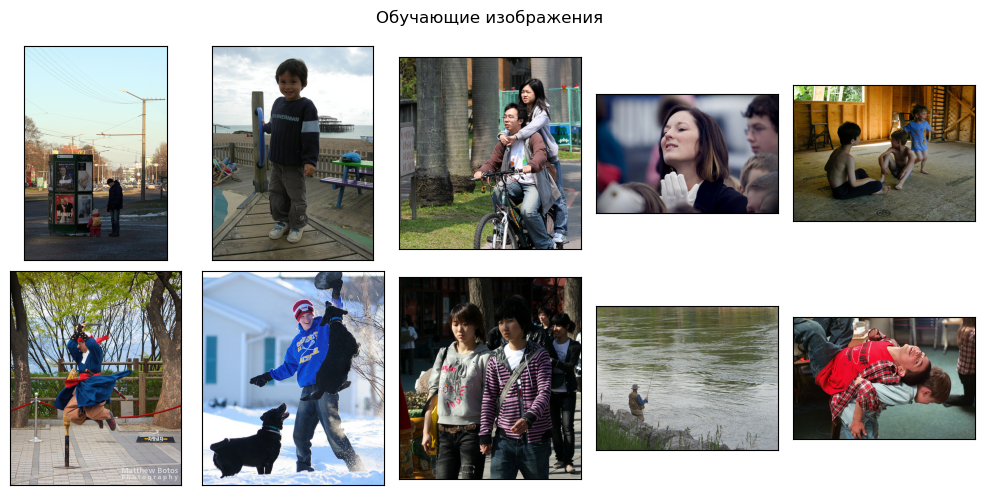

In [34]:
fig, axes = plt.subplots(2, 5, figsize=(10, 5))

# Визуализация последних 10 тестовых изображений
for i, ax in enumerate(axes.flat):
    image_path = os.path.join(path_train_images, samples_train[i])  
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_xticks([])
    ax.set_yticks([])

plt.suptitle('Обучающие изображения')
plt.tight_layout()
plt.show()

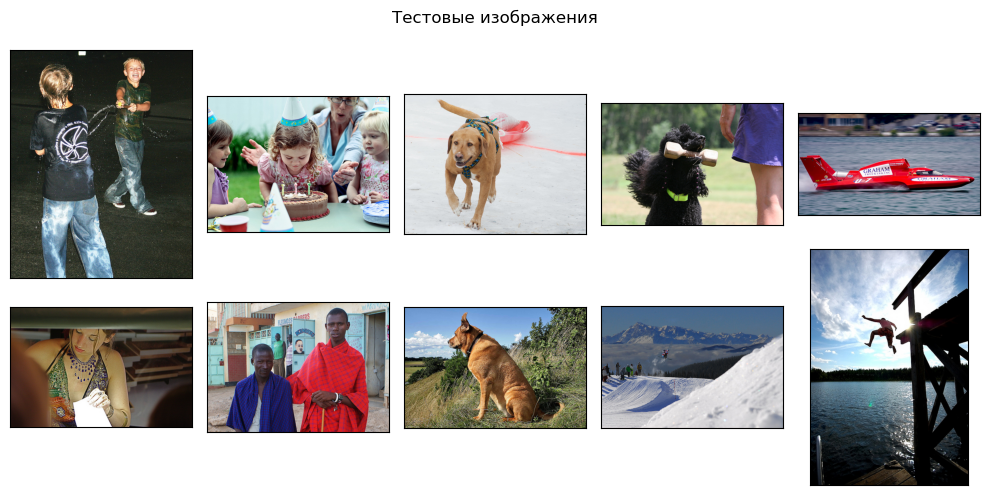

In [35]:
fig, axes = plt.subplots(2, 5, figsize=(10, 5))

for i, ax in enumerate(axes.flat):
    image_path = os.path.join(path_test_images, samples_test[i])  
    image = Image.open(image_path)
    ax.imshow(image)
    ax.set_xticks([])
    ax.set_yticks([])

plt.suptitle('Тестовые изображения')
plt.tight_layout()
plt.show()

Проверим есть ли пересечения в оценках между людьми и экспертами.

In [36]:
merged_df = pd.merge(data_expert, data_crowd, on=['query_id', 'image'], how='inner')

In [37]:
intersection_count = len(merged_df)
print(f'Количество пересечений: {intersection_count}')

Количество пересечений: 2328


Количество пересейений составляет 2328. Будем думать как их использовать.

Подготовка целевого признака. 

Для удобства работы с таблицами выведем нахвания их столюцов 

In [38]:
print(data_expert.columns)
print(data_crowd.columns)

Index(['image', 'query_id', '1', '2', '3'], dtype='object')
Index(['image', 'query_id', 'percent_pioples', 'count_true', 'count_false'], dtype='object')


Аггрегируем экспертную оценку усреднением ответов и сведением к диапазону [0,1]

In [39]:
def expert_estimation(row):

    if row['1'] != row['2'] != row['3']: #если оценки разные усредняем
        row['expert_score'] = np.mean([row['1'], row['2'], row['3']])/3

    else: #если есть одинаковые оценки - аггрегируем голосованием
        row['expert_score'] = min(1, (max(set([row['1'], row['2'], row['3']]), key = [row['1'], row['2'], row['3']].count)) / 3)

    return row

In [40]:
data_expert = data_expert.progress_apply(expert_estimation, axis=1)

100%|██████████| 5821/5821 [00:01<00:00, 3802.46it/s]


Посмотрим, что у нас получилось

In [41]:
display(data_expert.sample(5))

,image,query_id,1,2,3,expert_score
2773,3024172109_a10198e1dd.jpg,3503623999_bbd5dcfb18.jpg#2,1,1,1,0.333333
2442,2893374123_087f98d58a.jpg,2472980433_210ec62874.jpg#2,3,4,4,1.000000
5398,496110746_a93ca191ae.jpg,3542484764_77d8920ec9.jpg#2,1,1,1,0.333333
4159,3458211052_bb73084398.jpg,2495931537_9b8d4474b6.jpg#2,1,1,1,0.333333
5285,468608014_09fd20eb9b.jpg,3250695024_93e8ab7305.jpg#2,1,1,1,0.333333


Изучим распределение, у нас не должно быть оценки выше 1-цы

In [42]:
data_expert['expert_score'].describe()

count    5821.000000
mean        0.523717
std         0.242673
min         0.333333
25%         0.333333
50%         0.333333
75%         0.666667
max         1.000000
Name: expert_score, dtype: float64

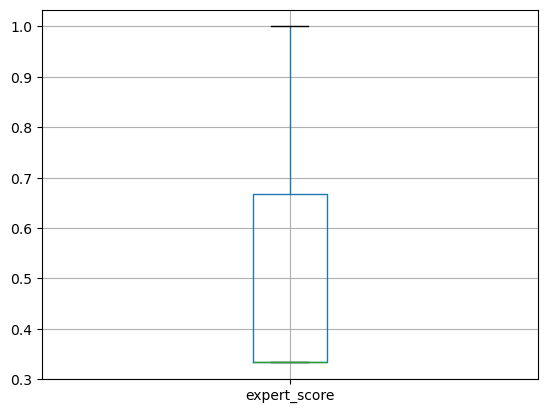

In [43]:
data_expert.boxplot(column='expert_score');

Мы получили не плохое распределение.

Объединим оценки экспертов и людей в один датасет.

In [44]:
data_scores = pd.merge(data_expert, data_crowd, how='outer', on=['image', 'query_id'])

In [45]:
display(data_scores.sample(5))

,image,query_id,1,2,3,expert_score,percent_pioples,count_true,count_false
14950,2544182005_3aa1332bf9.jpg,2944362789_aebbc22db4.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0
19416,2796801478_8ebd7e550b.jpg,2944362789_aebbc22db4.jpg#2,NaN,NaN,NaN,NaN,0.666667,2.0,1.0
38064,3498997518_c2b16f0a0e.jpg,241347760_d44c8d3a01.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0
44995,398662202_97e5819b79.jpg,2663794355_e726ec7e05.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0
20365,2854959952_3991a385ab.jpg,2763044275_aa498eb88b.jpg#2,NaN,NaN,NaN,NaN,0.333333,1.0,2.0


У нас образовались пропуски, поскольку не все фотографии были изучены экспертами.

In [46]:
data_scores.isna().sum()

image                  0
query_id               0
1                  45501
2                  45501
3                  45501
expert_score       45501
percent_pioples     3493
count_true          3493
count_false         3493
dtype: int64

Заполним пропуски.

In [47]:
def score_aggregate(row) -> object:

    '''аггрегируем оценки людей и экспертов'''

    if np.isnan(row['expert_score']):
        row['score'] = row['percent_pioples']
    elif np.isnan(row['percent_pioples']):
        row['score'] = row['expert_score']
    else:
        row['score'] = row['expert_score'] * 0.6 + row['percent_pioples'] * 0.4
        
    return row



In [48]:
data_scores = data_scores.progress_apply(score_aggregate, axis=1)

100%|██████████| 51322/51322 [00:12<00:00, 4261.34it/s]


In [49]:
display(data_scores.sample(5))

,image,query_id,1,2,3,expert_score,percent_pioples,count_true,count_false,score
48714,533979933_a95b03323b.jpg,2183227136_8bb657846b.jpg#2,NaN,NaN,NaN,NaN,0.666667,2.0,1.0,0.666667
5031,1836335410_de8313a64e.jpg,3320356356_1497e53f80.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
4142,160792599_6a7ec52516.jpg,2729655904_1dd01922fb.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
3946,1561658940_a947f2446a.jpg,3516825206_5750824874.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000
47395,494792770_2c5f767ac0.jpg,1764955991_5e53a28c87.jpg#2,NaN,NaN,NaN,NaN,0.000000,0.0,3.0,0.000000


In [50]:
data_scores['score'].describe()

count    51322.000000
mean         0.105563
std          0.231590
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: score, dtype: float64

In [51]:
data_scores.isna().sum()

image                  0
query_id               0
1                  45501
2                  45501
3                  45501
expert_score       45501
percent_pioples     3493
count_true          3493
count_false         3493
score                  0
dtype: int64

In [52]:
train_dataset = pd.merge(train_dataset, data_scores[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])

In [53]:
train_dataset.isna().sum()

image             0
query_id          0
query_text    45500
score             0
dtype: int64

In [54]:
to_fill = train_dataset[train_dataset['query_text'].notna()]

In [55]:
to_fill.isna().sum()

image         0
query_id      0
query_text    0
score         0
dtype: int64

Заполним получившие пропуски в описании. 

In [56]:
def fill_text(row):

    '''заполняем пропуски текстов в тренировочном наборе данных'''

    if pd.isnull(row['query_text']):
        texts = to_fill[to_fill['query_id'] == row['query_id']]['query_text']
        if len(texts) > 0:
            row['query_text'] = texts.iloc[0]

    return row



In [57]:
train_dataset = train_dataset.progress_apply(fill_text, axis=1)

100%|██████████| 51322/51322 [00:19<00:00, 2621.58it/s]


In [58]:
display(train_dataset.sample(5))

,image,query_id,query_text,score
18475,2718024196_3ff660416a.jpg,3051384385_c5c850c1f8.jpg#2,a young child balancing a plate in the air on ...,0.000000
35206,3397220683_4aca010f86.jpg,468608014_09fd20eb9b.jpg#2,a golden retriever plays with a toy .,0.000000
47039,486917990_72bd4069af.jpg,3287549827_04dec6fb6e.jpg#2,Person in gray jacket and blue pants balancing...,0.666667
14773,2541104331_a2d65cfa54.jpg,3375991133_87d7c40925.jpg#2,many children play in the water .,0.000000
35601,3422458549_f3f3878dbf.jpg,3688858505_e8afd1475d.jpg#2,A girl is wear a green dress .,0.000000


In [59]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51322 entries, 0 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51322 non-null  object 
 1   query_id    51322 non-null  object 
 2   query_text  50213 non-null  object 
 3   score       51322 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


Имеется небольшое количество пропусков, которые мы не смогли заполнить, удалим их

In [60]:
train_dataset.dropna(inplace=True)

In [61]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50213 entries, 0 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50213 non-null  object 
 1   query_id    50213 non-null  object 
 2   query_text  50213 non-null  object 
 3   score       50213 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


Подготовка текста, будем проводить его по следущему плану:
1) очистим текст и приведем его к одному регистру.
2) проведем его лментищацию.
3) заблокируем, запрещенные по законодательву, картинки.

In [62]:
def clear_text(text):
    clear_list = re.sub(r'[^a-zA-Z ]', ' ', text).lower()
    clear_text = " ".join(clear_list.split())
    return clear_text

In [63]:
def lemmatize(text):
    doc = nlp(text)
    lemm_list = [token.lemma_ for token in doc]
    lemm_text = " ".join(lemm_list) 
    return lemm_text

In [64]:
def bloc_crime_words(row) -> object:
    '''отмечаем тексты для блокирования'''
    text = lemmatize(row['query_text'])
    words = set(text.split())  # Разделение текста на отдельные слова и преобразование в множество
    if any(word in words for word in BLOCK_WORDS):
        row['to_block'] = 1
    else:
        row['to_block'] = 0
    return row

Применим наши фенкции.

In [65]:
train_dataset['query_text'] = train_dataset['query_text'].progress_apply(clear_text)

100%|██████████| 50213/50213 [00:00<00:00, 437576.40it/s]


train_dataset['query_text'] = train_dataset['query_text'].progress_apply(lemmatize)

In [66]:
train_dataset = train_dataset.progress_apply(bloc_crime_words, axis=1)

100%|██████████| 50213/50213 [02:46<00:00, 301.29it/s]


Посмотрим на наш датасет, после произведенных манипуляций. 

Посмотрим, что получилось. 

In [67]:
display(train_dataset.sample(5))

,image,query_id,query_text,score,to_block
4526,1714316707_8bbaa2a2ba.jpg,2660008870_b672a4c76a.jpg#2,a little boy is jumping out of the pool,0.0,1
13200,247637795_fdf26a03cf.jpg,2731171552_4a808c7d5a.jpg#2,a man holding a young boy on his shoulder,0.0,1
33119,3325497914_f9014d615b.jpg,2498897831_0bbb5d5b51.jpg#2,three little girls make silly faces on a woode...,0.0,1
23347,2966552760_e65b22cd26.jpg,2932740428_b15384f389.jpg#2,a motorcyclist wearing a red and white jacket ...,0.0,0
11500,241346508_0b3907a95b.jpg,3232470286_903a61ea16.jpg#2,a soccer player tries to kick the ball in the ...,0.0,0


Изучим предложения, которые мы заблокировали.

In [68]:
print(train_dataset[train_dataset['to_block'] == 1]['query_text'].sample(5).unique())

['two girls and a woman walking on the sidewalk'
 'a young boy is practicing his karate in a gym'
 'a large white dog a girl and a police car in a driveway and an suv in a garage'
 'two smiling little girls playing in a fountain with other people'
 'two children look up']


Посмотрим на фотографии, которые мы поставили под запрет, согласно их описанию.

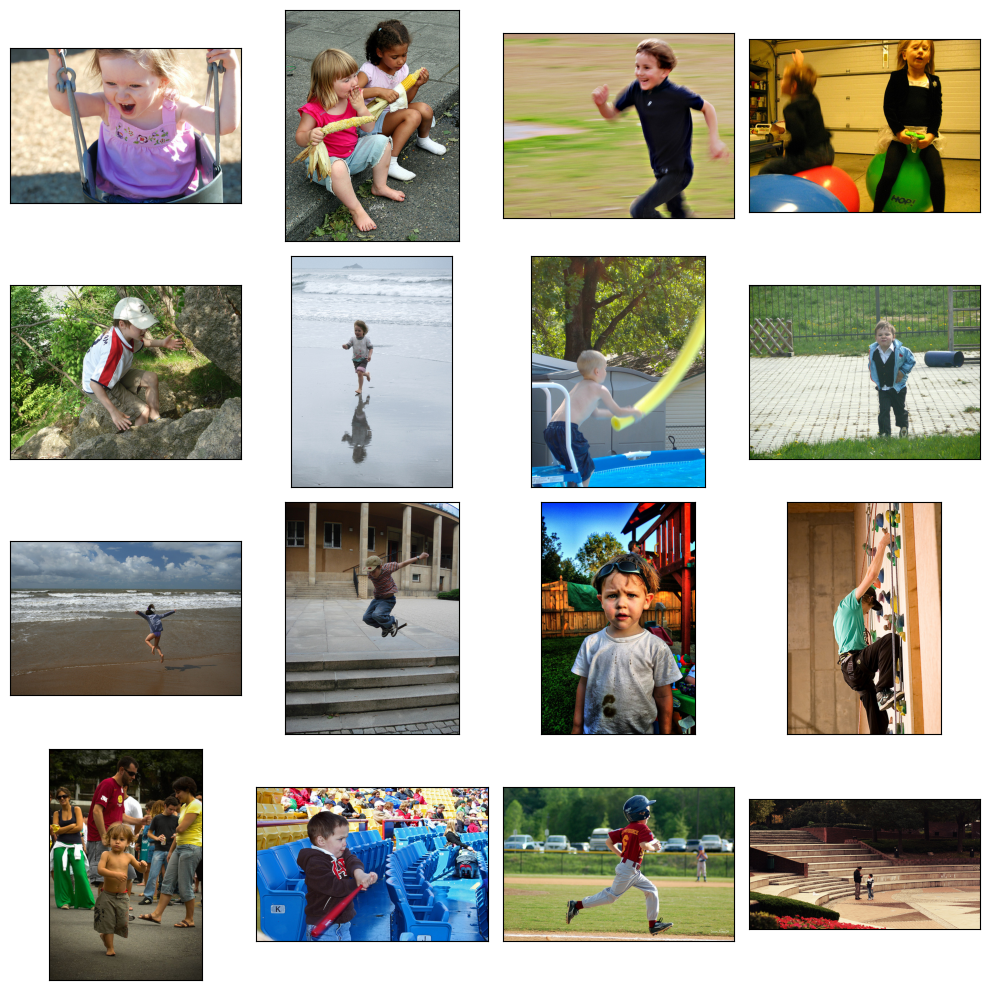

In [69]:
samples = list(train_dataset[train_dataset['to_block'] == 1]['query_id'].sample(16))
samples = [i[:-2] for i in samples]

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image_path = os.path.join(path_train_images, samples[i])  
    image = Image.open(image_path)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Теперь удалим эти фото из перечня и удалим нащ вспомогателбный столбец. 

In [70]:
train_dataset.drop(train_dataset[train_dataset['to_block'] == 1].index, inplace=True, errors='ignore')
train_dataset.drop(columns='to_block', inplace=True, errors='ignore')
train_dataset.reset_index(inplace=True, drop=True)

In [71]:
display(train_dataset.sample(5))

,image,query_id,query_text,score
4803,2148916767_644ea6a7fa.jpg,166507476_9be5b9852a.jpg#2,two lizards fighting,0.0
29831,3613955682_3860e116cf.jpg,3317073508_7e13565c1b.jpg#2,a soccer player jumping in air during a game,0.0
13623,2822290399_97c809d43b.jpg,2589241160_3832440850.jpg#2,two dogs are running towards each other on a b...,0.0
20623,3214885227_2be09e7cfb.jpg,1490213660_9ea45550cf.jpg#2,a male weimaraner with a clipped tail is walki...,0.0
7851,241031254_0c6f30e3d1.jpg,1836335410_de8313a64e.jpg#2,man dressed up in black and brown and holding ...,0.0


In [72]:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36124 entries, 0 to 36123
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       36124 non-null  object 
 1   query_id    36124 non-null  object 
 2   query_text  36124 non-null  object 
 3   score       36124 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.1+ MB


В данном разделе мы:

- подготовили текст(очистили, привели к одному регистру, поставли блок на запрешенных словах)
- подготовили целевой признак - оценку ползоватлей и экспертов.
- заполнили все получивгиеся пропуски
- удалили все запрещенные фотографии, что бы они не попали в обучении и не мещади нашей моделе.

в результате у нас полностью подготовленный датасет. Теперь нам нужно подготовить наши вектора. 

## Ообработка изображений. 

Подготовим загрузчик данных.

In [78]:
try:
    embeddings_loaded_img = np.loadtxt('pict_embeds.txt', delimiter=',')
    print('данные загружены, шаги по получению векторов можно пропустить')
    print(embeddings_loaded_img.shape)
except:
    print('Проект запускается первый раз, пройдите все шаги')

данные загружены, шаги по получению векторов можно пропустить
(36124, 2048)


In [73]:
def load_train(path=path_train_images) -> ImageDataGenerator:
    
    
    '''загрузчик данных для обучения'''
    
    train_datagen = ImageDataGenerator(rescale=1/255.)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=train_dataset,
        directory=os.path.join(path_train_images),
        x_col='image',
        y_col='score',
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)
    
    return train_gen_flow

Проверим работу подачи изображений, выведем несколько фотографий. Для простоты экспериментов, мы сохраним получившиеся вектора, что бы не пересчитывать их каждый раз

Found 36124 validated image filenames.


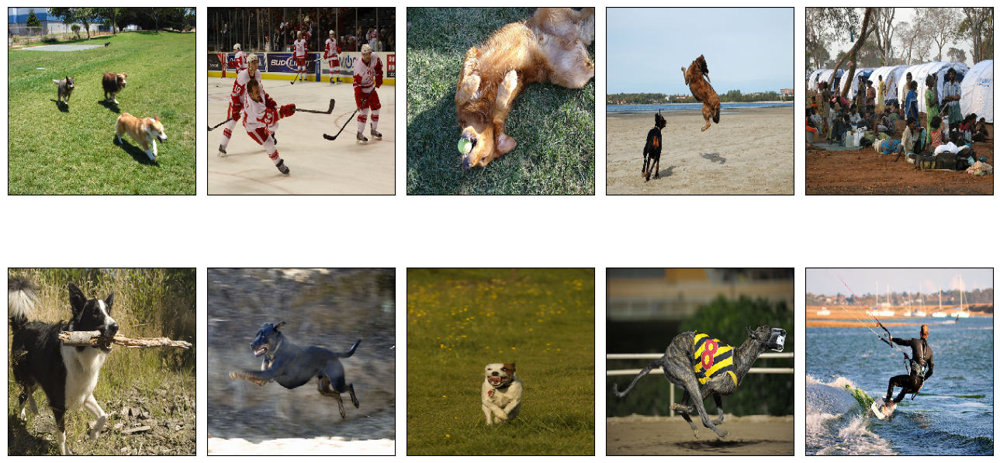

In [73]:
flow_train = load_train()
features, target = next(flow_train)

fig = plt.figure(figsize=(13,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

Подготовим нащу модель. Мы используем предобученную модель ResNet50

In [95]:
def create_model(input_shape=(256, 256, 3)):
    
    '''задаём архитектуру сети'''
    
    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    
    return model

Получим вектора из изображений.

In [96]:
def vectorize_pictures(model, train_data):
    
    '''превращаем данные в вектор'''
    
    predictions = model.predict(train_data)
    
    return predictions

In [76]:
%%time

pict_embeds = vectorize_pictures(create_model(), load_train())

Found 36124 validated image filenames.
2258/2258 [==============================] - 114s 50ms/step
Wall time: 1min 57s


In [77]:
pict_embeds.shape

(36124, 2048)

Сохраним полученные данные.

In [78]:
np.savetxt('pict_embeds.txt', pict_embeds, delimiter=',')

В данном разделе, мы получили вектора из изображений, сохранили их в файл. Так же в сама начае мы пробуем загрузить данные, если проект запускается не первый раз. 

## Обработка текста

In [74]:
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
config = BertConfig.from_pretrained('bert-base-uncased')
bert_model = BertModel.from_pretrained('bert-base-uncased', config=config)

In [108]:
if torch.cuda.is_available():
    model = bert_model.to('cuda')

In [75]:
try: 
    embeddings_loaded = np.loadtxt('embeddings.txt', delimiter=',')
    print('данные загружены, шаги по получению векторов можно пропустить')
    print(embeddings_loaded.shape)
except:
    print('проект запускается врепвые, пройдите все шаги')

данные загружены, шаги по получению векторов можно пропустить
(36124, 768)


In [82]:
tokenized = train_dataset['query_text'].apply(lambda x: tokenizer.encode(x, add_special_tokens=True))

Запустим получение векторов на GPU

In [84]:
def get_bert_embeddings(texts, tokenizer, model, batch_size=64):
    input_ids = []
    attention_masks = []

    for text in tqdm(texts):
        encoded_dict = tokenizer.encode_plus(
                            text,
                            add_special_tokens=True,
                            max_length=512,  
                            padding='max_length',
                            truncation=True,
                            return_attention_mask=True
                       )
        input_ids.append(encoded_dict['input_ids'])
        attention_masks.append(encoded_dict['attention_mask']) 

    embeddings = []

    for i in tqdm(range((len(input_ids) + batch_size - 1) // batch_size)):  
        start_index = batch_size * i
        end_index = min(batch_size * (i + 1), len(input_ids))

        batch = torch.LongTensor(input_ids[start_index:end_index]).to('cuda')
        attention_mask_batch = torch.LongTensor(attention_masks[start_index:end_index]).to('cuda')

        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        embeddings.append(batch_embeddings[0][:, 0, :].cpu().numpy())

    embeddings = np.concatenate(embeddings)

    return embeddings

In [85]:
train_texts = train_dataset['query_text'].tolist()

In [86]:
train_embeddings = get_bert_embeddings(train_texts, tokenizer, model)

100%|██████████| 565/565 [09:37<00:00,  1.02s/it]


In [87]:
train_embeddings.shape

(36124, 768)

Сохраним в файл, что бы не пересчитаывать при повторном запуске кода.

In [88]:
np.savetxt('embeddings.txt', train_embeddings, delimiter=',')

Теперь мы можем получить наш признак и цель изучения.

In [79]:
X = np.concatenate((embeddings_loaded_img, embeddings_loaded), axis=1)
X.shape

(36124, 2816)

In [80]:
y = np.array(train_dataset['score'])
y.shape

(36124,)

Мы предусмотрели возможность запуска нашего проекта без пересчета векторов, что позволит нам использовать одни и теже данные для экспериментов и отслеживать прогресс в поиске гипер параметров модели. 

Теперь подготоаим наши данные и разделим их на обучашую и тестовую выборку. Это нам нужно дла выявления нашей лучшем моделе, которую мы проверим на валидационных данных. 

In [81]:
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=SEED)
train_indices, test_indices = next(gss.split(X=X, y=y, groups=train_dataset['image']))

In [82]:
X_train, X_test = X[train_indices], X[test_indices]

In [83]:
y_train, y_test = y[train_indices], y[test_indices]

In [84]:
scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)


Мы прошли долгий путь подготовки данных после которого: 

- получены вектора из изображений и тектов
- данные сохранены в файлы, что бы избежать повторных пересчетов и траты времени.
- получен целевой признак
- данные разделены на тестовую и обучающую выборку.
- лучшую модель будем тестировать на валидационной выборке.

После всего проделланоого мы можем приступить к обучению и тестированию моделей. 

### LinearRegression

In [99]:
model = LinearRegression()

In [100]:
param_grid = {}

gs_lr = GridSearchCV(
    model,
    param_grid,
    scoring='neg_root_mean_squared_error',
    cv=KFold(n_splits=5, shuffle=True)
)

In [101]:
%time gs_lr.fit(X_train, y_train)

Wall time: 28.7 s


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=LinearRegression(), param_grid={},
             scoring='neg_root_mean_squared_error')

In [102]:
best_estimator = gs_lr.best_estimator_

In [103]:
pred = best_estimator.predict(X_test)

In [104]:
mean_squared_error(y_test, pred, squared=False).round(decimals=3)

0.234

Модель показала относительно не плохой результат. Посмотрим другие модели. 

### LinearSVR

In [107]:
model = LinearSVR(random_state=SEED)

param_grid = {
    'loss': ['squared_epsilon_insensitive', 'epsilon_insensitive'],  # Разные функции потерь
    'C': [0.1, 1, 10],  # Разные значения параметра регуляризации
    'epsilon': [0.1, 0.2, 0.5],  # Значения параметра эпсилон
    'max_iter': [1000, 2000, 3000],  # Максимальное количество итераций
    'dual': [True, False, 'auto']  # Явное указание параметра dual
}

gs_svr = GridSearchCV(
    model,
    param_grid,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    cv=GroupShuffleSplit(n_splits=3, random_state=SEED),
    verbose=1
)

In [108]:
%time gs_svr.fit(X_train, y_train, groups=train_dataset['image'].loc[train_indices])
None

Fitting 3 folds for each of 162 candidates, totalling 486 fits


C:\Users\Kvas6\anaconda3\envs\py39\lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
81 fits failed out of a total of 486.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
81 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Kvas6\anaconda3\envs\py39\lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Kvas6\anaconda3\envs\py39\lib\site-packages\sklearn\base.py", line 1151, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\Kvas6\anaconda3\envs\py39\lib\site-packages\sklearn\svm\_classes.py", line 568, in fit
    self.coef_, self.intercept_, n

Wall time: 3h 28min 25s


C:\Users\Kvas6\anaconda3\envs\py39\lib\site-packages\sklearn\svm\_base.py:1242: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [109]:
pd.DataFrame(gs_svr.cv_results_)[['param_C', 'param_loss', 'mean_test_score', 'rank_test_score']].round(decimals=3)

,param_C,param_loss,mean_test_score,rank_test_score
0,0.1,squared_epsilon_insensitive,-0.249,27
1,0.1,squared_epsilon_insensitive,-0.246,12
2,0.1,squared_epsilon_insensitive,-0.246,11
3,0.1,epsilon_insensitive,-0.247,25
4,0.1,epsilon_insensitive,-0.244,3
...,...,...,...,...
157,10,squared_epsilon_insensitive,-0.411,130
158,10,squared_epsilon_insensitive,-0.411,130
159,10,epsilon_insensitive,-0.409,104
160,10,epsilon_insensitive,-0.409,118


In [110]:
best_SVR_estimator = gs_svr.best_estimator_

In [112]:
predict_SVR_test = best_SVR_estimator.predict(X_test)

In [114]:
mean_squared_error(y_test, predict_SVR_test, squared=False).round(decimals=3)

0.237

Модель показала результат, чуть лусше чем у LinearRegression, но обучалась она очень продолжительное время. 

### NeuralNetwork

In [114]:
NN = Sequential()
NN.add(Dense(2816, input_shape=(2816,), activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(256, activation='relu'))
NN.add(BatchNormalization())
NN.add(Dense(1, activation='relu'))

optimizer = Adam(learning_rate=1e-5)

NN.compile(optimizer=optimizer, loss='mean_squared_error',
            metrics=[tf.keras.metrics.RootMeanSquaredError()])

NN.build()

NN.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 2816)              7932672   
                                                                 
 batch_normalization_2 (Batc  (None, 2816)             11264     
 hNormalization)                                                 
                                                                 
 dense_4 (Dense)             (None, 256)               721152    
                                                                 
 batch_normalization_3 (Batc  (None, 256)              1024      
 hNormalization)                                                 
                                                                 
 dense_5 (Dense)             (None, 1)                 257       
                                                                 
Total params: 8,666,369
Trainable params: 8,660,225
No

In [115]:
%time 
NN.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    batch_size=32, epochs=10,
    verbose=2, shuffle=True
    )

Wall time: 0 ns
Epoch 1/10
909/909 - 5s - loss: 0.2790 - root_mean_squared_error: 0.5282 - val_loss: 0.1408 - val_root_mean_squared_error: 0.3752 - 5s/epoch - 5ms/step
Epoch 2/10
909/909 - 4s - loss: 0.1223 - root_mean_squared_error: 0.3497 - val_loss: 0.0891 - val_root_mean_squared_error: 0.2984 - 4s/epoch - 4ms/step
Epoch 3/10
909/909 - 4s - loss: 0.0878 - root_mean_squared_error: 0.2963 - val_loss: 0.0806 - val_root_mean_squared_error: 0.2839 - 4s/epoch - 4ms/step
Epoch 4/10
909/909 - 3s - loss: 0.0752 - root_mean_squared_error: 0.2743 - val_loss: 0.0747 - val_root_mean_squared_error: 0.2733 - 3s/epoch - 4ms/step
Epoch 5/10
909/909 - 4s - loss: 0.0695 - root_mean_squared_error: 0.2636 - val_loss: 0.0774 - val_root_mean_squared_error: 0.2783 - 4s/epoch - 4ms/step
Epoch 6/10
909/909 - 4s - loss: 0.0652 - root_mean_squared_error: 0.2554 - val_loss: 0.0749 - val_root_mean_squared_error: 0.2737 - 4s/epoch - 4ms/step
Epoch 7/10
909/909 - 4s - loss: 0.0619 - root_mean_squared_error: 0.2488

Результаты схожи с предыдущими моделями

## Cat_boost

In [85]:
CBC = CatBoostRegressor()

In [86]:
parameters = {
    'depth': [1, 4, 6],
    'iterations': [100],  
    'loss_function': ['RMSE'],  
    'task_type': ['GPU']
}

In [87]:
Grid_CBC = GridSearchCV(
    estimator=CBC, 
    param_grid = parameters, 
    cv=KFold(n_splits=5, shuffle=True), 
    scoring='neg_root_mean_squared_error',
    refit=True,
    verbose=1,
)

In [88]:
%time Grid_CBC.fit(X_train, y_train,  verbose=False)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
Wall time: 3min


GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=<catboost.core.CatBoostRegressor object at 0x00000137EC6302B0>,
             param_grid={'depth': [1, 4, 6], 'iterations': [100],
                         'loss_function': ['RMSE'], 'task_type': ['GPU']},
             scoring='neg_root_mean_squared_error', verbose=1)

In [89]:
print(Grid_CBC.best_score_)

-0.23796886837273906


In [90]:
cat_best = Grid_CBC.best_estimator_

In [91]:
cat_pred = cat_best.predict(X_test)

In [92]:
mean_squared_error(y_test, cat_pred, squared=False).round(decimals=3)

0.231

Все модели показали относительно походий результат. Для валидационной выборки возьмем нейронную сеть, поскольку она быстро обучается и показала высокий результат. 

## Тестирование модели 

In [97]:
def load_test(path=path_test_images) -> ImageDataGenerator:
    
    '''загрузчик данных для тестирования'''
    
    test_datagen = ImageDataGenerator(rescale=1/255.)
    test_gen_flow = test_datagen.flow_from_dataframe(
        dataframe=test_images,
        directory=os.path.join(path),
        x_col='image',
        y_col=None,
        target_size=(256, 256),
        batch_size=16,
        class_mode='input',
        seed=SEED)
    
    return test_gen_flow

In [98]:
def create_model(input_shape=(256, 256, 3)):
    
    '''задаём архитектуру сети'''
    
    backbone = ResNet50(input_shape=input_shape,
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    
    return model

In [99]:
def vectorize_pictures(model, train_data):
    
    '''превращаем данные в вектор'''
    
    predictions = model.predict(train_data)
    
    return predictions

In [100]:
%%time

pict_embeds_test = vectorize_pictures(create_model(), load_test())
pict_embeds_test.shape

Found 100 validated image filenames.
7/7 [==============================] - 3s 125ms/step
Wall time: 12.5 s


(100, 2048)

In [101]:
PATH = '.'

In [105]:
def get_bert_embeddings(texts, tokenizer, model, batch_size=64):
    input_ids = []
    attention_masks = []

    for text in tqdm(texts):
        encoded_dict = tokenizer.encode_plus(
                            text,
                            add_special_tokens=True,
                            max_length=512,  
                            padding='max_length',
                            truncation=True,
                            return_attention_mask=True
                       )
        input_ids.append(encoded_dict['input_ids'])
        attention_masks.append(encoded_dict['attention_mask']) 

    embeddings = []

    for i in tqdm(range((len(input_ids) + batch_size - 1) // batch_size)):  
        start_index = batch_size * i
        end_index = min(batch_size * (i + 1), len(input_ids))

        batch = torch.LongTensor(input_ids[start_index:end_index]).to('cuda')
        attention_mask_batch = torch.LongTensor(attention_masks[start_index:end_index]).to('cuda')

        with torch.no_grad():
            batch_embeddings = model(batch, attention_mask=attention_mask_batch)

        embeddings.append(batch_embeddings[0][:, 0, :].cpu().numpy())

    embeddings = np.concatenate(embeddings)

    return embeddings

In [118]:
def get_picture(text) -> None:

    '''Проверяем легальность запроса, получаем наиболее похожие картинки,
    если описание среди оригинальных картинок - добавляем последней верную'''
    
    if any(word in clear_text(lemmatize(text)) for word in BLOCK_WORDS): #проверяем не нужно ли вывести на экран заглушку
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print('This image is unavailable in your country in compliance with local laws.')
        print('')
    else:
        text_embed = get_bert_embeddings(model=bert_model, texts=[text], tokenizer=tokenizer) #получаем эмбеддинг текста
        X = np.concatenate(( #объединяем вектора тестовых картинок с эмбеддингом текста
            pict_embeds_test,
            np.resize(text_embed, (pict_embeds_test.shape[0],768))),
            axis=1)
        X = scaler.transform(X)
        predictions = NN.predict(X) #получаем предсказания оценок экспертов
        df = pd.concat((test_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) #добавляем оценки к номерам картинок
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) #получили топ 5 имён файлов с картинками
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) #получили топ 5 оценок
        
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        fig = plt.figure(figsize=(15,5)) #выводим на экран 5 наиболее похожих картинок
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(test_queries['query_text']): #если текст был в исходном файле с описаниями - добавляем оригинальную картинку
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']))
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

In [119]:
samples = test_queries.sample(10)
text_test = list(samples['query_text'])
text_test

['A man lies on a blue blanket with a child on his back .',
 'A young boy throwing a rock into a pond in front of a large building .',
 'The dog jumps up to catch the red ball .',
 'A red-headed girl offers the peace sign as she swims in the pool with floaties .',
 'two black dogs playing fetch with a red toy',
 'a man wearing red socks playing running with some other men',
 'the man is wearing a backpack and sunglasses while walking through an outdoor market .',
 'A dog is catching a yellow tennis ball on the beach .',
 'A man is jumping off a rock into a pool of water while three others watch .',
 'A little white dog runs on freshly mown grass , holding a small stick .']


-------------------- A man lies on a blue blanket with a child on his back . --------------------

This image is unavailable in your country in compliance with local laws.


-------------------- A young boy throwing a rock into a pond in front of a large building . --------------------

This image is unavailable in your country in compliance with local laws.



100%|██████████| 1/1 [00:01<00:00,  1.55s/it]

4/4 [==============================] - 0s 1ms/step



-------------------- The dog jumps up to catch the red ball . --------------------



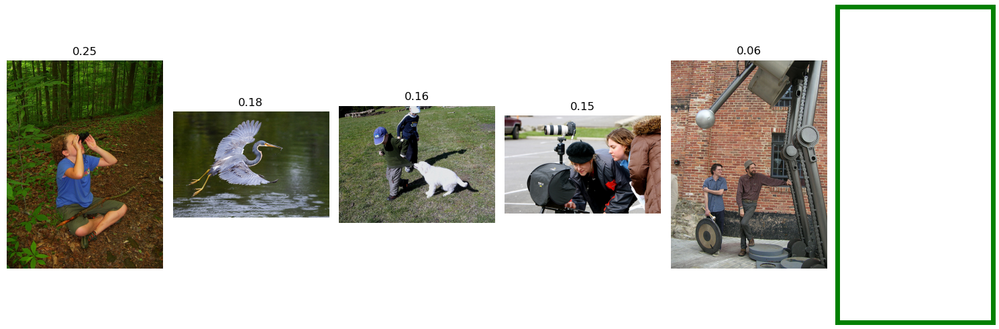


-------------------- A red-headed girl offers the peace sign as she swims in the pool with floaties . --------------------

This image is unavailable in your country in compliance with local laws.



100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

4/4 [==============================] - 0s 2ms/step



-------------------- two black dogs playing fetch with a red toy --------------------



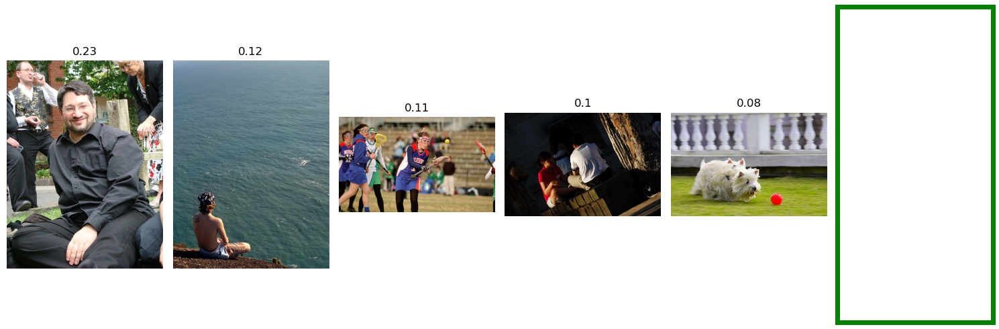

100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

4/4 [==============================] - 0s 1ms/step



-------------------- a man wearing red socks playing running with some other men --------------------



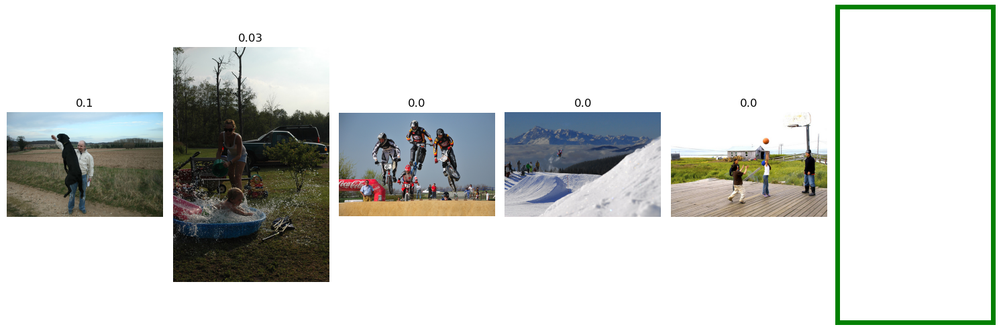

100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

4/4 [==============================] - 0s 1ms/step



-------------------- the man is wearing a backpack and sunglasses while walking through an outdoor market . --------------------



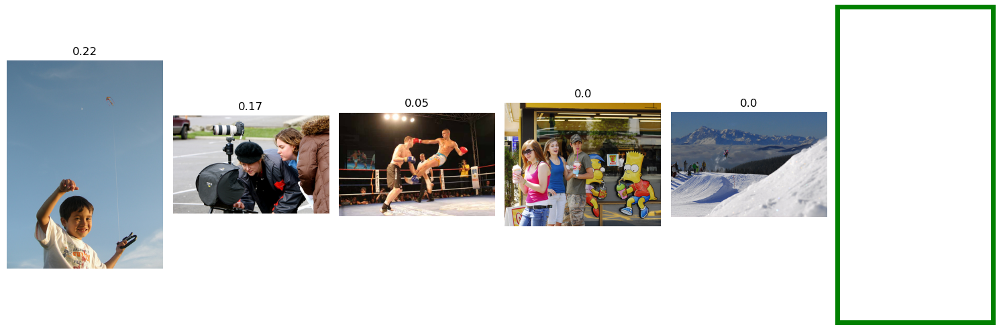

100%|██████████| 1/1 [00:01<00:00,  1.50s/it]

4/4 [==============================] - 0s 2ms/step



-------------------- A dog is catching a yellow tennis ball on the beach . --------------------



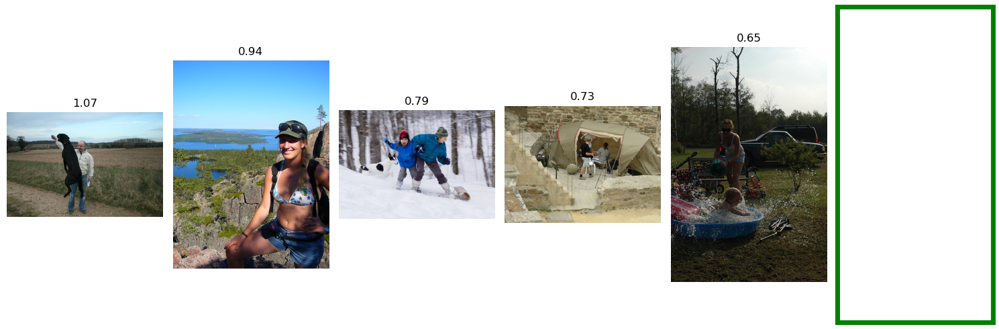

100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

4/4 [==============================] - 0s 2ms/step



-------------------- A man is jumping off a rock into a pool of water while three others watch . --------------------



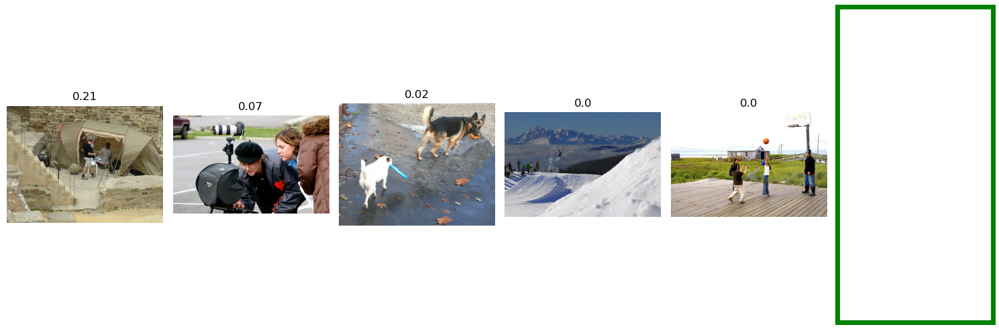

100%|██████████| 1/1 [00:01<00:00,  1.44s/it]

4/4 [==============================] - 0s 1ms/step



-------------------- A little white dog runs on freshly mown grass , holding a small stick . --------------------



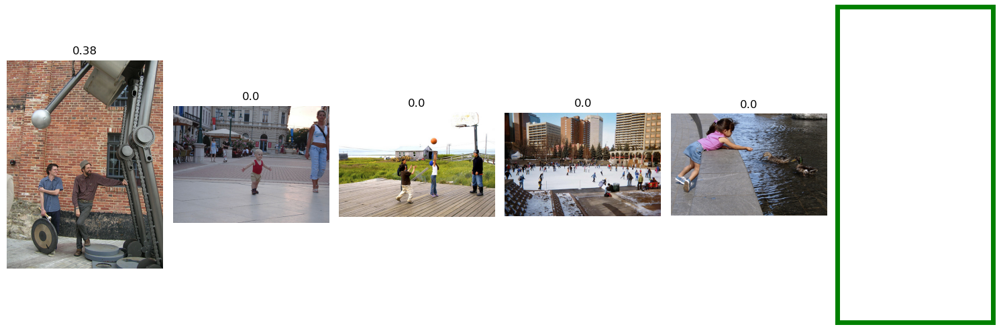

In [120]:
for text in text_test:
    get_picture(text)

## Вывод

В данной работе мы делали MVP для системы поиска изображений по фотографии.

В ходе работы для векторизации изображений мы использовали сеть ResNet50, а для текстовых эмбеддингов BERT base cased EN.

После объединения признаков и выделения целей (экспертные оценки схожести описания и картинок), мы исследовали три модели для оценки схожести:

   * LinearRegression
   * LinearSVR
   * трёхслойную нейронную сеть
   * CatBoost

Лучше всего себя показала нейронная сеть, с ней мы провели тесты.

В конце работы мы написали функцию которая по тексту возвращает 5 наиболее похожих картинок и протестировали её на предложенном наборе тестовых картинок.

К сожалению выбранный подход не оправдал себя. Лишь в некоторых случаях в топ5 выдачи попадает верная картинка и, чуть чаще, попадают картинки связанные тематически. Так же мы не можем предобработать валидационные фотографии и мы выводим фотографии, на которых присутствуют дети. Хотя и тестовая выборка показала, что если в описании нет запрезенных слов, то мы все равно выводим запрещенные фотографии.

В качестве возможных путей для решения можно предложить использовать полный набор картинок из датасета Flickr30k и смену архитектуры решения.